In [298]:
import pandas as pd
import numpy as np

In [299]:
df = pd.read_csv('zomato_data.csv')

In [300]:
df

,online_order,book_table,rate,votes,rest_type,dish_liked,cuisines,approx_costfor_two_people,listed_intype,listed_incity
0,Yes,Yes,4.1/5,775,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,Buffet,Banashankari
1,Yes,No,4.1/5,787,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,Buffet,Banashankari
2,Yes,No,3.8/5,918,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,Buffet,Banashankari
3,No,No,3.7/5,88,Quick Bites,Masala Dosa,"South Indian, North Indian",300,Buffet,Banashankari
4,No,No,3.8/5,166,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,Buffet,Banashankari
...,...,...,...,...,...,...,...,...,...,...
51712,No,No,3.6 /5,27,Bar,NaN,Continental,"1,500",Pubs and bars,Whitefield
51713,No,No,NaN,0,Bar,NaN,Finger Food,600,Pubs and bars,Whitefield
51714,No,No,NaN,0,Bar,NaN,Finger Food,"2,000",Pubs and bars,Whitefield
51715,No,Yes,4.3 /5,236,Bar,"Cocktails, Pizza, Buttermilk",Finger Food,"2,500",Pubs and bars,Whitefield


In [301]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51717 entries, 0 to 51716
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   online_order               51717 non-null  object
 1   book_table                 51717 non-null  object
 2   rate                       43942 non-null  object
 3   votes                      51717 non-null  int64 
 4   rest_type                  51490 non-null  object
 5   dish_liked                 23639 non-null  object
 6   cuisines                   51672 non-null  object
 7   approx_costfor_two_people  51371 non-null  object
 8   listed_intype              51717 non-null  object
 9   listed_incity              51717 non-null  object
dtypes: int64(1), object(9)
memory usage: 3.9+ MB


In [302]:
# Step 1: Replace '-' with NaN
df['rate'] = df['rate'].replace('-', np.nan)

# Step 2: Remove '/5' and retain only numeric value
df['rate'] = df['rate'].str.replace('/5', '', regex=False)


In [303]:
df

,online_order,book_table,rate,votes,rest_type,dish_liked,cuisines,approx_costfor_two_people,listed_intype,listed_incity
0,Yes,Yes,4.1,775,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,Buffet,Banashankari
1,Yes,No,4.1,787,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,Buffet,Banashankari
2,Yes,No,3.8,918,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,Buffet,Banashankari
3,No,No,3.7,88,Quick Bites,Masala Dosa,"South Indian, North Indian",300,Buffet,Banashankari
4,No,No,3.8,166,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,Buffet,Banashankari
...,...,...,...,...,...,...,...,...,...,...
51712,No,No,3.6,27,Bar,NaN,Continental,"1,500",Pubs and bars,Whitefield
51713,No,No,NaN,0,Bar,NaN,Finger Food,600,Pubs and bars,Whitefield
51714,No,No,NaN,0,Bar,NaN,Finger Food,"2,000",Pubs and bars,Whitefield
51715,No,Yes,4.3,236,Bar,"Cocktails, Pizza, Buttermilk",Finger Food,"2,500",Pubs and bars,Whitefield


In [304]:
# Step 3: Convert to float
df['rate'] = pd.to_numeric(df['rate'], errors='coerce')
# Step 4: Fill missing values with median
df['rate'] = df['rate'].fillna(df['rate'].median())

In [305]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51717 entries, 0 to 51716
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   online_order               51717 non-null  object 
 1   book_table                 51717 non-null  object 
 2   rate                       51717 non-null  float64
 3   votes                      51717 non-null  int64  
 4   rest_type                  51490 non-null  object 
 5   dish_liked                 23639 non-null  object 
 6   cuisines                   51672 non-null  object 
 7   approx_costfor_two_people  51371 non-null  object 
 8   listed_intype              51717 non-null  object 
 9   listed_incity              51717 non-null  object 
dtypes: float64(1), int64(1), object(8)
memory usage: 3.9+ MB


In [306]:
df['approx_costfor_two_people'] = df['approx_costfor_two_people'].str.replace(',', '', regex=False)

In [307]:
df['approx_costfor_two_people'] = pd.to_numeric(df['approx_costfor_two_people'], errors='coerce')

In [308]:
df['approx_costfor_two_people'] = df['approx_costfor_two_people'].fillna(df['approx_costfor_two_people'].median())

In [309]:
df

,online_order,book_table,rate,votes,rest_type,dish_liked,cuisines,approx_costfor_two_people,listed_intype,listed_incity
0,Yes,Yes,4.1,775,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800.0,Buffet,Banashankari
1,Yes,No,4.1,787,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800.0,Buffet,Banashankari
2,Yes,No,3.8,918,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800.0,Buffet,Banashankari
3,No,No,3.7,88,Quick Bites,Masala Dosa,"South Indian, North Indian",300.0,Buffet,Banashankari
4,No,No,3.8,166,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600.0,Buffet,Banashankari
...,...,...,...,...,...,...,...,...,...,...
51712,No,No,3.6,27,Bar,NaN,Continental,1500.0,Pubs and bars,Whitefield
51713,No,No,3.7,0,Bar,NaN,Finger Food,600.0,Pubs and bars,Whitefield
51714,No,No,3.7,0,Bar,NaN,Finger Food,2000.0,Pubs and bars,Whitefield
51715,No,Yes,4.3,236,Bar,"Cocktails, Pizza, Buttermilk",Finger Food,2500.0,Pubs and bars,Whitefield


In [310]:
df['dish_liked'] = df['dish_liked'].fillna('Not Available')

In [311]:
df['cuisines'] = df['cuisines'].fillna('Other')

In [312]:
df['rest_type'] = df['rest_type'].fillna('Unknown')

In [313]:
df

,online_order,book_table,rate,votes,rest_type,dish_liked,cuisines,approx_costfor_two_people,listed_intype,listed_incity
0,Yes,Yes,4.1,775,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800.0,Buffet,Banashankari
1,Yes,No,4.1,787,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800.0,Buffet,Banashankari
2,Yes,No,3.8,918,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800.0,Buffet,Banashankari
3,No,No,3.7,88,Quick Bites,Masala Dosa,"South Indian, North Indian",300.0,Buffet,Banashankari
4,No,No,3.8,166,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600.0,Buffet,Banashankari
...,...,...,...,...,...,...,...,...,...,...
51712,No,No,3.6,27,Bar,Not Available,Continental,1500.0,Pubs and bars,Whitefield
51713,No,No,3.7,0,Bar,Not Available,Finger Food,600.0,Pubs and bars,Whitefield
51714,No,No,3.7,0,Bar,Not Available,Finger Food,2000.0,Pubs and bars,Whitefield
51715,No,Yes,4.3,236,Bar,"Cocktails, Pizza, Buttermilk",Finger Food,2500.0,Pubs and bars,Whitefield


In [314]:
# Convert to numeric in case it's stored as string
df['votes'] = pd.to_numeric(df['votes'], errors='coerce')

# Fill NaN values with the median
df['votes'] = df['votes'].fillna(df['votes'].median())

In [315]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51717 entries, 0 to 51716
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   online_order               51717 non-null  object 
 1   book_table                 51717 non-null  object 
 2   rate                       51717 non-null  float64
 3   votes                      51717 non-null  int64  
 4   rest_type                  51717 non-null  object 
 5   dish_liked                 51717 non-null  object 
 6   cuisines                   51717 non-null  object 
 7   approx_costfor_two_people  51717 non-null  float64
 8   listed_intype              51717 non-null  object 
 9   listed_incity              51717 non-null  object 
dtypes: float64(2), int64(1), object(7)
memory usage: 3.9+ MB


In [316]:
df['online_order'] = df['online_order'].map({'Yes': 1, 'No': 0})
df['book_table'] = df['book_table'].map({'Yes': 1, 'No': 0})

In [317]:
df

,online_order,book_table,rate,votes,rest_type,dish_liked,cuisines,approx_costfor_two_people,listed_intype,listed_incity
0,1,1,4.1,775,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800.0,Buffet,Banashankari
1,1,0,4.1,787,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800.0,Buffet,Banashankari
2,1,0,3.8,918,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800.0,Buffet,Banashankari
3,0,0,3.7,88,Quick Bites,Masala Dosa,"South Indian, North Indian",300.0,Buffet,Banashankari
4,0,0,3.8,166,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600.0,Buffet,Banashankari
...,...,...,...,...,...,...,...,...,...,...
51712,0,0,3.6,27,Bar,Not Available,Continental,1500.0,Pubs and bars,Whitefield
51713,0,0,3.7,0,Bar,Not Available,Finger Food,600.0,Pubs and bars,Whitefield
51714,0,0,3.7,0,Bar,Not Available,Finger Food,2000.0,Pubs and bars,Whitefield
51715,0,1,4.3,236,Bar,"Cocktails, Pizza, Buttermilk",Finger Food,2500.0,Pubs and bars,Whitefield


In [318]:
# Convert 'rate' to float
df['rate'] = df['rate'].astype(float)

# Convert 'votes' to integer
df['votes'] = df['votes'].astype(int)

# Convert 'approx_costfor_two_people' to integer
df['approx_costfor_two_people'] = df['approx_costfor_two_people'].astype(int)

In [319]:
df["cuisines"].str.split(', ')

,cuisines
0,"[North Indian, Mughlai, Chinese]"
1,"[Chinese, North Indian, Thai]"
2,"[Cafe, Mexican, Italian]"
3,"[South Indian, North Indian]"
4,"[North Indian, Rajasthani]"
...,...
51712,[Continental]
51713,[Finger Food]
51714,[Finger Food]
51715,[Finger Food]


# Cuisines

In [320]:

cuisine_series = df['cuisines'].dropna()


all_cuisines = cuisine_series.str.split(', ').explode()


cuisine_counts = all_cuisines.value_counts()

print(len(cuisine_counts))


108


<ipython-input-321-d042c9622f15>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


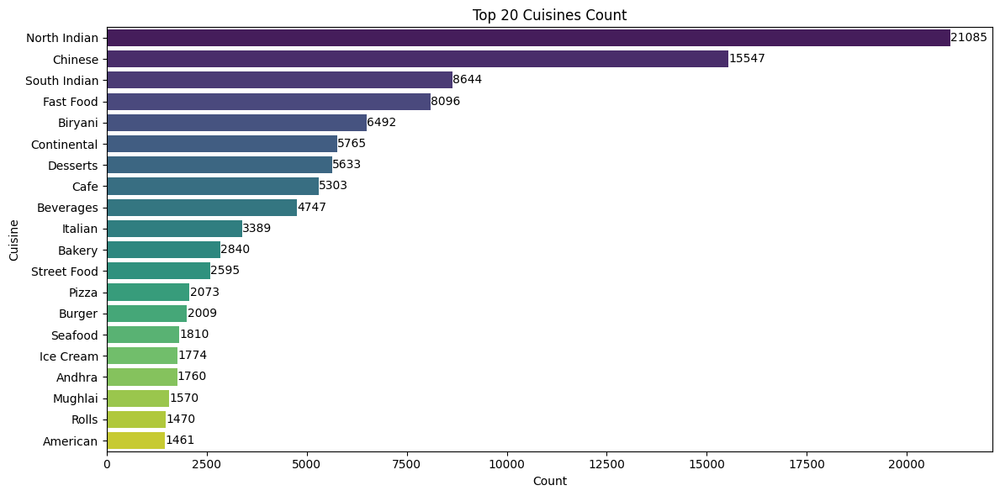

In [321]:
import matplotlib.pyplot as plt
import seaborn as sns


# Plot the top 20 cuisines (or all if you prefer)
plt.figure(figsize=(12, 6))
ax = sns.barplot(
    x=cuisine_counts.head(20).values,
    y=cuisine_counts.head(20).index,
    palette='viridis'
)

# Add count labels to each bar
for i, v in enumerate(cuisine_counts.head(20).values):
    ax.text(v + 5, i, str(v), color='black', va='center')
plt.xlabel("Count")
plt.ylabel("Cuisine")
plt.title("Top 20 Cuisines Count")
plt.tight_layout()
plt.show()

<ipython-input-322-4bff5f3eb650>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=cuisine_counts.tail(20).values, y=cuisine_counts.tail(20).index, palette='viridis')


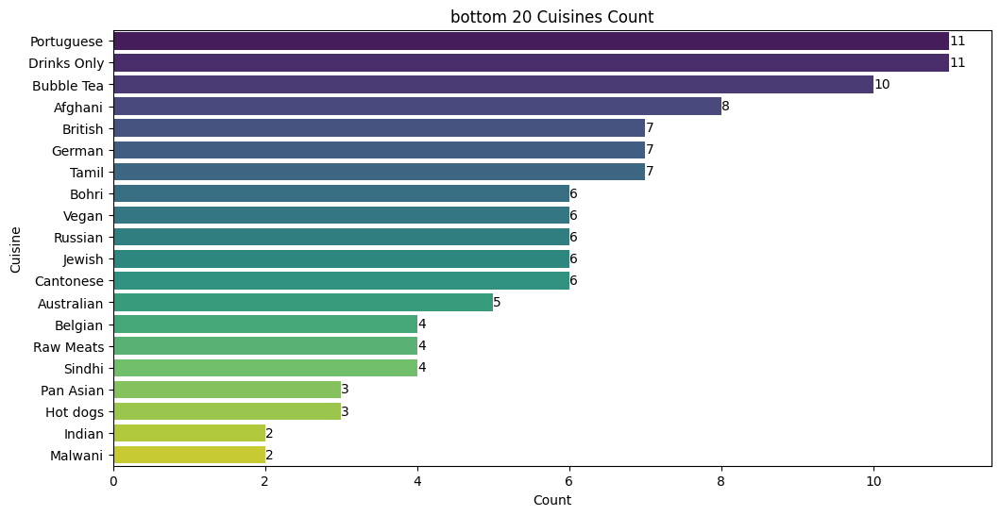

In [322]:
# Plot the least 20 cuisines (or all if you prefer)
plt.figure(figsize=(12, 6))
ax = sns.barplot(x=cuisine_counts.tail(20).values, y=cuisine_counts.tail(20).index, palette='viridis')
# Add count labels to each bar
for i, v in enumerate(cuisine_counts.tail(20).values):
    ax.text(v, i, str(v), color='black', va='center')
plt.xlabel("Count")
plt.ylabel("Cuisine")
plt.title("bottom 20 Cuisines Count")

plt.show();

# Rest Type

In [323]:
# Drop missing values if any
rest_series = df['rest_type'].dropna()

# Split and flatten the list of cuisines
rest = rest_series.str.split(', ').explode()

# Count the frequency of each cuisine
rest_counts = rest.value_counts()

print(len(rest_counts))


26


<ipython-input-324-063cf787a1a3>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=rest_counts.head(20).values, y=rest_counts.tail(20).index, palette='viridis')


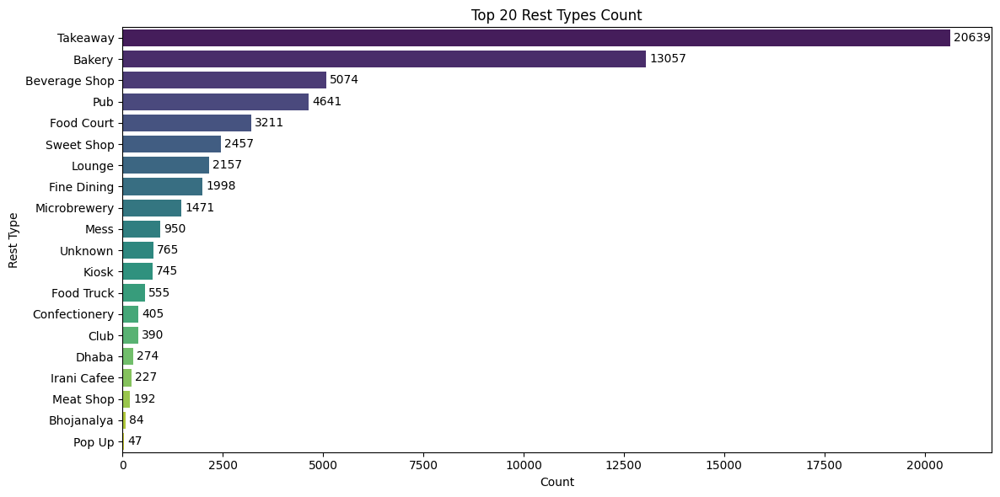

In [324]:
import matplotlib.pyplot as plt
import seaborn as sns


# Plot the top 20 cuisines (or all if you prefer)
plt.figure(figsize=(12, 6))
ax = sns.barplot(x=rest_counts.head(20).values, y=rest_counts.tail(20).index, palette='viridis')
for container in ax.containers:
    ax.bar_label(container, label_type='edge', padding=3)
plt.xlabel("Count")
plt.ylabel("Rest Type")
plt.title("Top 20 Rest Types Count")
plt.tight_layout()
plt.show()

# Dish Liked

In [325]:
# Drop missing values if any
dishes = df['dish_liked'].dropna()

# Split and flatten the list of cuisines
all_dishes = dishes.str.split(', ').explode()

# Count the frequency of each cuisine
dishes_counts = all_dishes.value_counts()

print(len(dishes_counts))

2793


<ipython-input-326-31ead171d390>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=dishes_counts.head(20).values, y=dishes_counts.tail(20).index, palette='viridis')


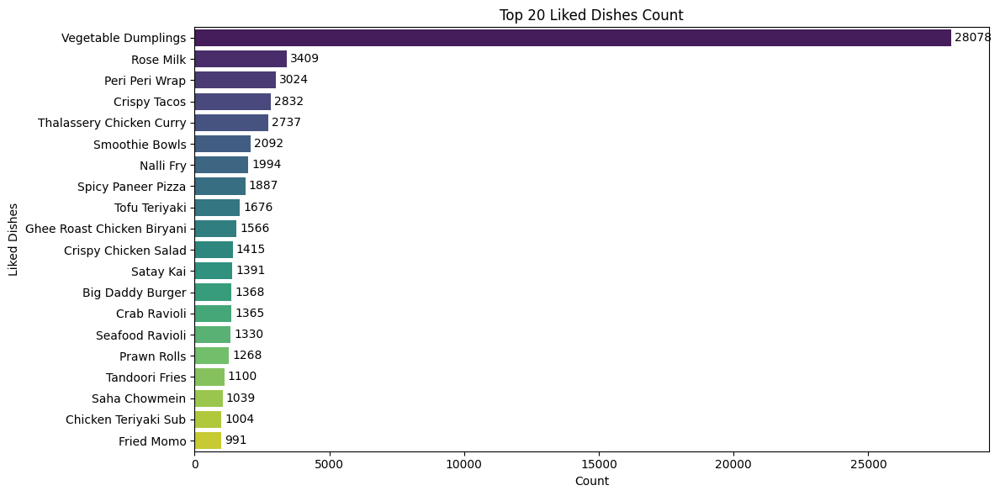

In [326]:
import matplotlib.pyplot as plt
import seaborn as sns


# Plot the top 20 cuisines (or all if you prefer)
plt.figure(figsize=(12, 6))
ax = sns.barplot(x=dishes_counts.head(20).values, y=dishes_counts.tail(20).index, palette='viridis')
for container in ax.containers:
    ax.bar_label(container, label_type='edge', padding=3)
plt.xlabel("Count")
plt.ylabel("Liked Dishes")
plt.title("Top 20 Liked Dishes Count")
plt.tight_layout()
plt.show()

In [328]:
df["listed_intype"].value_counts()

,count
listed_intype,
Delivery,25942
Dine-out,17779
Desserts,3593
Cafes,1723
Drinks & nightlife,1101
Buffet,882
Pubs and bars,697


# listed_intype

<ipython-input-329-7d5c81695c2d>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(data=df, y='listed_intype', order=df['listed_intype'].value_counts().index, palette='coolwarm')


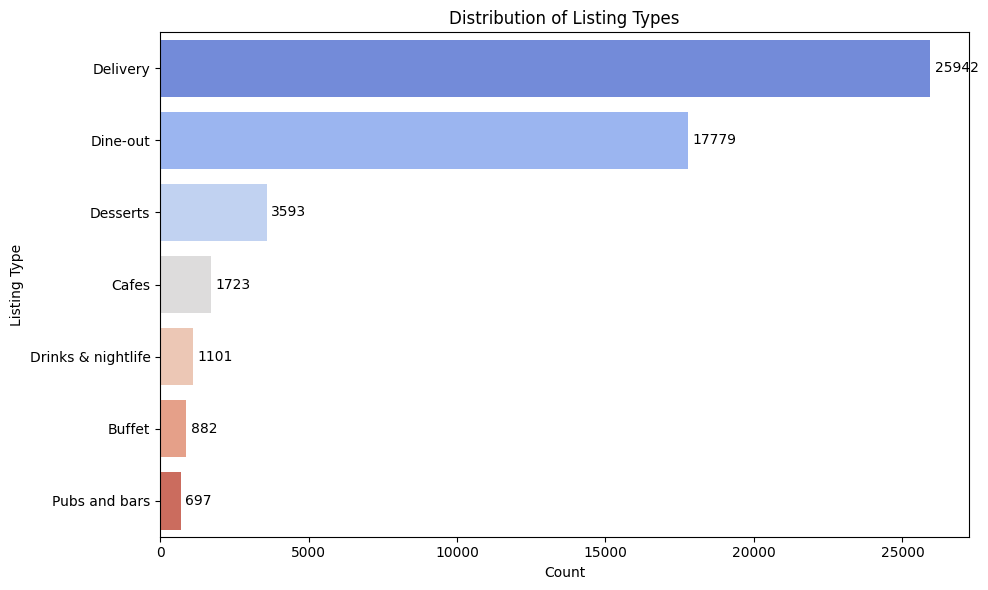

In [329]:
# Plotting bar chart for listed_in(type)
plt.figure(figsize=(10, 6))
ax = sns.countplot(data=df, y='listed_intype', order=df['listed_intype'].value_counts().index, palette='coolwarm')
# Add count labels to bars
for container in ax.containers:
    ax.bar_label(container, label_type='edge', padding=3)
plt.xlabel("Count")
plt.ylabel("Listing Type")
plt.title("Distribution of Listing Types")
plt.tight_layout()
plt.show()


# listed_incity

<ipython-input-330-a8ab2533c43f>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(data=df, y='listed_incity', order=df['listed_incity'].value_counts().index, palette='coolwarm')


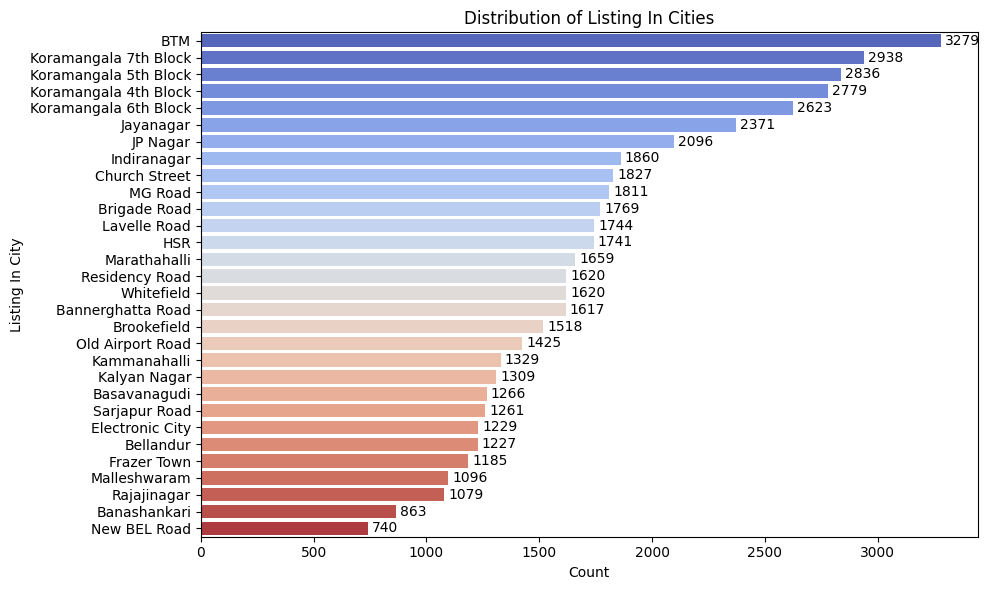

In [330]:

plt.figure(figsize=(10, 6))
ax = sns.countplot(data=df, y='listed_incity', order=df['listed_incity'].value_counts().index, palette='coolwarm')

for container in ax.containers:
    ax.bar_label(container, label_type='edge', padding=3)
plt.xlabel("Count")
plt.ylabel("Listing In City")
plt.title("Distribution of Listing In Cities")
plt.tight_layout()
plt.show()

In [331]:
df

,online_order,book_table,rate,votes,rest_type,dish_liked,cuisines,approx_costfor_two_people,listed_intype,listed_incity
0,1,1,4.1,775,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,Buffet,Banashankari
1,1,0,4.1,787,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,Buffet,Banashankari
2,1,0,3.8,918,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,Buffet,Banashankari
3,0,0,3.7,88,Quick Bites,Masala Dosa,"South Indian, North Indian",300,Buffet,Banashankari
4,0,0,3.8,166,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,Buffet,Banashankari
...,...,...,...,...,...,...,...,...,...,...
51712,0,0,3.6,27,Bar,Not Available,Continental,1500,Pubs and bars,Whitefield
51713,0,0,3.7,0,Bar,Not Available,Finger Food,600,Pubs and bars,Whitefield
51714,0,0,3.7,0,Bar,Not Available,Finger Food,2000,Pubs and bars,Whitefield
51715,0,1,4.3,236,Bar,"Cocktails, Pizza, Buttermilk",Finger Food,2500,Pubs and bars,Whitefield


# Rating

<ipython-input-332-63f5e14ca689>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=rate_counts.index.astype(str), y=rate_counts.values, palette='pastel')


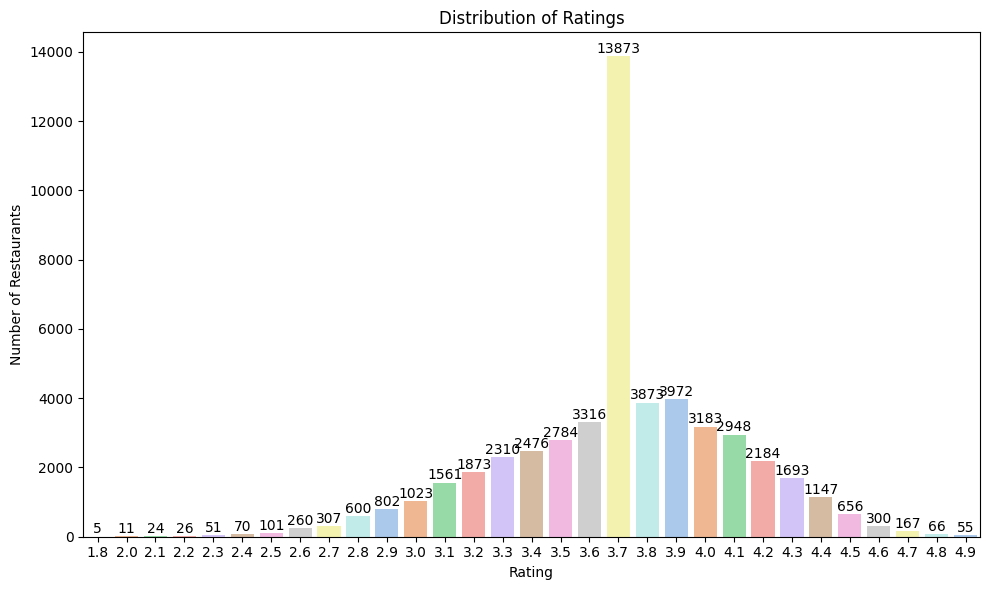

In [332]:
df['rate'] = pd.to_numeric(df['rate'], errors='coerce')


rate_counts = df['rate'].dropna().value_counts().sort_index()

plt.figure(figsize=(10, 6))
ax = sns.barplot(x=rate_counts.index.astype(str), y=rate_counts.values, palette='pastel')


for i, v in enumerate(rate_counts.values):
    ax.text(i, v + 5, str(int(v)), ha='center', va='bottom')

plt.xlabel("Rating")
plt.ylabel("Number of Restaurants")
plt.title("Distribution of Ratings")
plt.tight_layout()
plt.show()


# Online Orders and Booked Tables

In [333]:
print("Online Order Counts:")
print(df['online_order'].value_counts())

print("\nBook Table Counts:")
print(df['book_table'].value_counts())

Online Order Counts:
online_order
1    30444
0    21273
Name: count, dtype: int64

Book Table Counts:
book_table
0    45268
1     6449
Name: count, dtype: int64


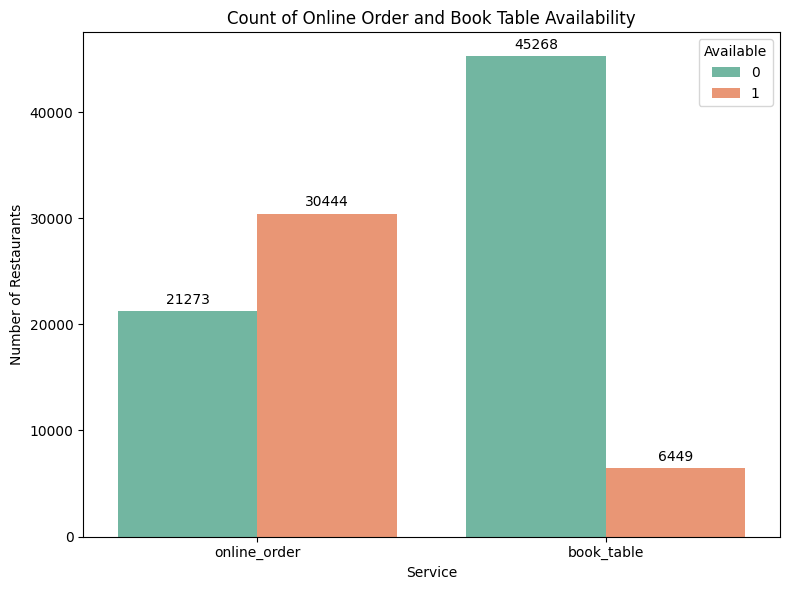

In [334]:
melted_df = df.melt(value_vars=['online_order', 'book_table'], var_name='Service', value_name='Available')

plt.figure(figsize=(8, 6))
ax = sns.countplot(data=melted_df, x='Service', hue='Available', palette='Set2')

# Add labels
for container in ax.containers:
    ax.bar_label(container, label_type='edge', padding=3)

plt.title("Count of Online Order and Book Table Availability")
plt.ylabel("Number of Restaurants")
plt.tight_layout()
plt.show()


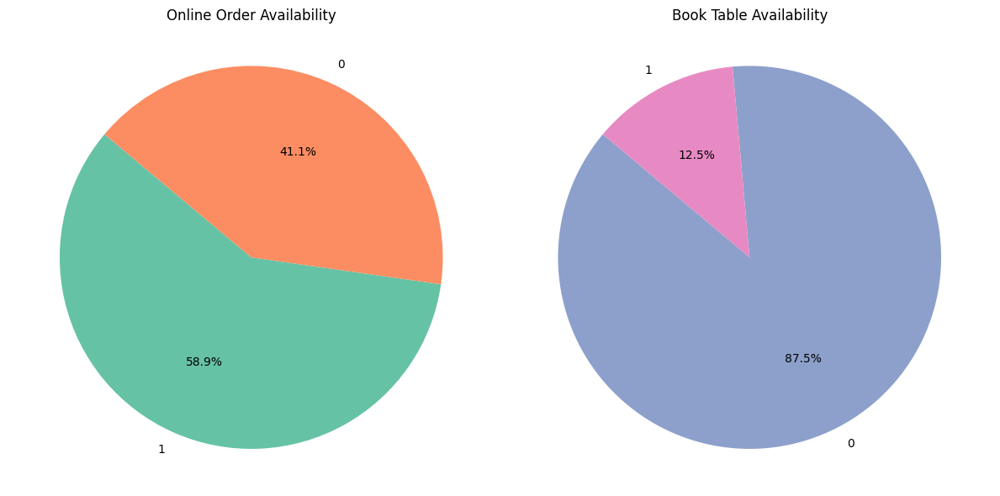

In [335]:

online_counts = df['online_order'].value_counts()
book_counts = df['book_table'].value_counts()


fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].pie(online_counts, labels=online_counts.index, autopct='%1.1f%%', colors=['#66c2a5', '#fc8d62'], startangle=140)
axes[0].set_title('Online Order Availability')
axes[0].axis('equal')


axes[1].pie(book_counts, labels=book_counts.index, autopct='%1.1f%%', colors=['#8da0cb', '#e78ac3'], startangle=140)
axes[1].set_title('Book Table Availability')
axes[1].axis('equal')

plt.tight_layout()
plt.show()


In [336]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51717 entries, 0 to 51716
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   online_order               51717 non-null  int64  
 1   book_table                 51717 non-null  int64  
 2   rate                       51717 non-null  float64
 3   votes                      51717 non-null  int64  
 4   rest_type                  51717 non-null  object 
 5   dish_liked                 51717 non-null  object 
 6   cuisines                   51717 non-null  object 
 7   approx_costfor_two_people  51717 non-null  int64  
 8   listed_intype              51717 non-null  object 
 9   listed_incity              51717 non-null  object 
dtypes: float64(1), int64(4), object(5)
memory usage: 3.9+ MB


In [337]:
map_data = pd.read_csv("Geographical Coordinates.csv")

In [338]:
map_data

,listed_incity,Latitude,Longitude
0,Banashankari,12.939333,77.553982
1,Bannerghatta Road,12.952660,77.605048
2,Basavanagudi,12.941726,77.575502
3,Bellandur,12.925352,77.675941
4,Brigade Road,12.967358,77.606435
5,Brookefield,12.963814,77.722437
6,BTM,12.916360,77.604733
7,Church Street,12.974914,77.605247
8,Electronic City,12.848760,77.648253
9,Frazer Town,12.998683,77.615525


In [339]:
italian = df[df["cuisines"].str.contains("Italian")]

In [340]:
italian

,online_order,book_table,rate,votes,rest_type,dish_liked,cuisines,approx_costfor_two_people,listed_intype,listed_incity
2,1,0,3.8,918,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,Buffet,Banashankari
7,1,1,4.6,2556,"Casual Dining, Cafe","Farmhouse Pizza, Chocolate Banana, Virgin Moji...","Pizza, Cafe, Italian",600,Cafes,Banashankari
8,1,0,4.0,324,Cafe,"Pizza, Mocktails, Coffee, Nachos, Salad, Pasta...","Cafe, Italian, Continental",700,Cafes,Banashankari
9,1,0,4.2,504,Cafe,"Waffles, Pasta, Coleslaw Sandwich, Choco Waffl...","Cafe, Mexican, Italian, Momos, Beverages",550,Cafes,Banashankari
11,1,1,4.2,150,Cafe,"Mocktails, Peri Fries, Lasagne, Pizza, Chicken...","Cafe, Italian, Continental",600,Cafes,Banashankari
...,...,...,...,...,...,...,...,...,...,...
51689,0,1,4.1,564,"Casual Dining, Bar","Mocktails, Pizza, Crispy Chicken, Beer, Nachos...","North Indian, Italian, Finger Food, Continental",1000,Pubs and bars,Whitefield
51691,0,1,4.2,156,"Bar, Casual Dining","Deep Dish Pizza, Mocktails, Burgers, Onion Rin...","American, Italian",1800,Pubs and bars,Whitefield
51700,0,1,4.1,1003,"Bar, Casual Dining","Mocktails, Cocktails, Pizza, Chicken Tikka, Na...","Continental, North Indian, Italian",1500,Pubs and bars,Whitefield
51701,1,1,4.1,673,Pub,"Cocktails, Wheat Beer, Bruschettas, Pasta, Bur...","Finger Food, North Indian, Chinese, Italian",1400,Pubs and bars,Whitefield


In [341]:
import pandas as pd
import folium

italian_df = italian[italian['cuisines'].str.contains('Italian', case=False, na=False)]

merged_df = pd.merge(italian_df, map_data, on='listed_incity')

center_lat = merged_df['Latitude'].mean()
center_lon = merged_df['Longitude'].mean()
m = folium.Map(location=[center_lat, center_lon], zoom_start=12)

for _, row in merged_df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=row['listed_incity'],
        icon=folium.Icon(color='red', icon='cutlery', prefix='fa')
    ).add_to(m)




In [342]:
m

In [ ]:
m.save("italian_restaurants_map.html")
m

In [343]:
import pandas as pd
import folium
from folium.plugins import MarkerCluster



italian_df = italian[italian['cuisines'].str.contains('Italian', case=False, na=False)]

# Step 2: Merge datasets on common column (like 'name')
merged_df = pd.merge(italian_df, map_data, on='listed_incity')

# Step 3: Create a folium map centered around a mean location
center_lat = merged_df['Latitude'].mean()
center_lon = merged_df['Longitude'].mean()
m = folium.Map(location=[center_lat, center_lon], zoom_start=12)

# Step 4: Add MarkerCluster to the map
marker_cluster = MarkerCluster().add_to(m)

# Step 5: Add markers for each Italian restaurant to the MarkerCluster
for _, row in merged_df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=row['listed_incity'],
        icon=folium.Icon(color='red', icon='cutlery', prefix='fa')
    ).add_to(marker_cluster)




In [ ]:
# Step 6: Save the map as an HTML file
map_path = "italian_restaurants_clustered_map.html"
m.save(map_path)

In [344]:
m

# **Qusetion and Answers**

1. What is the shape of the given dataset?

* (6263 rows, 10 columns)
* (51,717 rows, 10 columns)
* (6804 rows, 17 columns)
* (8450 rows, 11 columns)

In [345]:
df.shape

(51717, 10)

2. How many restaurants serve North Indian
* 14,567
* 21,085
* 11,234
* 15,678

In [346]:
# Drop missing values if any
cuisine_series = df['cuisines'].dropna()

# Split and flatten the list of cuisines
all_cuisines = cuisine_series.str.split(', ').explode()

# Count the frequency of each cuisine
cuisine_counts = all_cuisines.value_counts()

print(cuisine_counts)

cuisines
North Indian    21085
Chinese         15547
South Indian     8644
Fast Food        8096
Biryani          6492
                ...  
Sindhi              4
Pan Asian           3
Hot dogs            3
Indian              2
Malwani             2
Name: count, Length: 108, dtype: int64


3. What cuisine is most commonly offered by restaurants in Bangalore?

* North Indian
* South Indian
* Biryani
* Bakery, Desserts

In [347]:

Bangalore_city = pd.merge(italian_df, map_data, on='listed_incity')

In [348]:
Bangalore_city

,online_order,book_table,rate,votes,rest_type,dish_liked,cuisines,approx_costfor_two_people,listed_intype,listed_incity,Latitude,Longitude
0,1,0,3.8,918,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,Buffet,Banashankari,12.939333,77.553982
1,1,1,4.6,2556,"Casual Dining, Cafe","Farmhouse Pizza, Chocolate Banana, Virgin Moji...","Pizza, Cafe, Italian",600,Cafes,Banashankari,12.939333,77.553982
2,1,0,4.0,324,Cafe,"Pizza, Mocktails, Coffee, Nachos, Salad, Pasta...","Cafe, Italian, Continental",700,Cafes,Banashankari,12.939333,77.553982
3,1,0,4.2,504,Cafe,"Waffles, Pasta, Coleslaw Sandwich, Choco Waffl...","Cafe, Mexican, Italian, Momos, Beverages",550,Cafes,Banashankari,12.939333,77.553982
4,1,1,4.2,150,Cafe,"Mocktails, Peri Fries, Lasagne, Pizza, Chicken...","Cafe, Italian, Continental",600,Cafes,Banashankari,12.939333,77.553982
...,...,...,...,...,...,...,...,...,...,...,...,...
3041,0,1,4.4,2861,"Bar, Casual Dining","Pizza, Chocolate Cake, Cocktails, Nachos, Sang...","Continental, Asian, Italian, North Indian",1500,Pubs and bars,Old Airport Road,12.960632,77.642500
3042,1,1,4.1,1857,"Casual Dining, Bar","Pizza, Cocktails, Pasta, Mushroom Soup, Panna ...","Italian, Seafood, American, Continental",1100,Pubs and bars,Old Airport Road,12.960632,77.642500
3043,0,0,4.3,700,"Bar, Casual Dining","Beer, Cocktails, Chicken Burger, Pasta, Tandoo...","Continental, Burger, Italian, Pizza, North Ind...",400,Pubs and bars,Old Airport Road,12.960632,77.642500
3044,0,1,4.0,988,"Bar, Casual Dining","Bbq Chicken Pizza, Sangria, Cocktails, Beer, M...","Continental, Chinese, Italian",1400,Pubs and bars,Old Airport Road,12.960632,77.642500


In [349]:
Bangalore_city.dropna(inplace=True)

In [350]:

# Drop missing values if any
cuisine_series = Bangalore_city["cuisines"].dropna()

# Split and flatten the list of cuisines
all_cuisines = cuisine_series.str.split(', ').explode()

# Count the frequency of each cuisine
cuisine_counts = all_cuisines.value_counts()

cuisine_counts

,count
cuisines,
Italian,3046
Continental,1259
Cafe,1210
Pizza,741
North Indian,638
Chinese,542
Burger,493
American,410
Salad,357


4. Which locality in Bangalore has the highest average cost for dining (for two people)?

* Banashankari
* Church Street
* Indiranagar
* Whitefield

In [353]:
mean_cost = Bangalore_city["approx_costfor_two_people"].mean()

In [354]:
mean_cost

np.float64(881.3788575180565)

In [355]:
avg_cost_by_location = (
    Bangalore_city.groupby('listed_incity')['approx_costfor_two_people']
    .mean()
    .sort_values(ascending=False)
)

In [356]:
avg_cost_by_location

,approx_costfor_two_people
listed_incity,
Lavelle Road,1162.413793
MG Road,1119.677419
Church Street,1105.312500
Brigade Road,1089.677419
Electronic City,1060.465116
Indiranagar,1040.759494
Old Airport Road,1002.320000
Bellandur,939.873418
Malleshwaram,914.843750


5. Which restaurant type has the top rating with over 1000 votes?

* Bakery, Cafe
* Casual Dining, Pub
* Bakery
* Microbrewery, Pub

In [357]:
Bangalore_city

,online_order,book_table,rate,votes,rest_type,dish_liked,cuisines,approx_costfor_two_people,listed_intype,listed_incity,Latitude,Longitude
0,1,0,3.8,918,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,Buffet,Banashankari,12.939333,77.553982
1,1,1,4.6,2556,"Casual Dining, Cafe","Farmhouse Pizza, Chocolate Banana, Virgin Moji...","Pizza, Cafe, Italian",600,Cafes,Banashankari,12.939333,77.553982
2,1,0,4.0,324,Cafe,"Pizza, Mocktails, Coffee, Nachos, Salad, Pasta...","Cafe, Italian, Continental",700,Cafes,Banashankari,12.939333,77.553982
3,1,0,4.2,504,Cafe,"Waffles, Pasta, Coleslaw Sandwich, Choco Waffl...","Cafe, Mexican, Italian, Momos, Beverages",550,Cafes,Banashankari,12.939333,77.553982
4,1,1,4.2,150,Cafe,"Mocktails, Peri Fries, Lasagne, Pizza, Chicken...","Cafe, Italian, Continental",600,Cafes,Banashankari,12.939333,77.553982
...,...,...,...,...,...,...,...,...,...,...,...,...
3041,0,1,4.4,2861,"Bar, Casual Dining","Pizza, Chocolate Cake, Cocktails, Nachos, Sang...","Continental, Asian, Italian, North Indian",1500,Pubs and bars,Old Airport Road,12.960632,77.642500
3042,1,1,4.1,1857,"Casual Dining, Bar","Pizza, Cocktails, Pasta, Mushroom Soup, Panna ...","Italian, Seafood, American, Continental",1100,Pubs and bars,Old Airport Road,12.960632,77.642500
3043,0,0,4.3,700,"Bar, Casual Dining","Beer, Cocktails, Chicken Burger, Pasta, Tandoo...","Continental, Burger, Italian, Pizza, North Ind...",400,Pubs and bars,Old Airport Road,12.960632,77.642500
3044,0,1,4.0,988,"Bar, Casual Dining","Bbq Chicken Pizza, Sangria, Cocktails, Beer, M...","Continental, Chinese, Italian",1400,Pubs and bars,Old Airport Road,12.960632,77.642500


In [358]:
votings = Bangalore_city[Bangalore_city["votes"]>1000]

In [359]:
grouped = votings.groupby('rest_type')['rate'].mean()

In [360]:
grouped

,rate
rest_type,
"Bakery, Cafe",4.345455
Bar,4.050000
"Bar, Casual Dining",4.375000
Cafe,4.190446
"Cafe, Casual Dining",4.311538
Casual Dining,4.348052
"Casual Dining, Bar",4.240984
"Casual Dining, Cafe",4.362105
"Casual Dining, Pub",4.146154


6. How much does it cost at minimum to eat out in Bangalore?

* ₹200
* ₹500
* ₹300
* ₹1000

In [361]:
Bangalore_city.groupby("approx_costfor_two_people")["listed_incity"].min()

,listed_incity
approx_costfor_two_people,
200,BTM
240,Indiranagar
250,Banashankari
300,BTM
350,BTM
400,BTM
450,BTM
500,BTM
550,Banashankari


7. What percentage of total online orders is received by restaurants in Banashankari?

* 30%
* 44%
* 58%
* 75%

In [365]:
counts = Bangalore_city.groupby("listed_incity")["online_order"].value_counts()
# Calculating the percentage for each value
percentages = counts.groupby(level=0).apply(lambda x: 100 * x / float(x.sum()))

In [366]:
percentages

listed_incity          listed_incity          online_order
BTM                    BTM                    1               71.428571
                                              0               28.571429
Banashankari           Banashankari           1               78.260870
                                              0               21.739130
Bannerghatta Road      Bannerghatta Road      1               79.729730
                                              0               20.270270
Basavanagudi           Basavanagudi           1               78.160920
                                              0               21.839080
Bellandur              Bellandur              1               62.025316
                                              0               37.974684
Brigade Road           Brigade Road           1               54.193548
                                              0               45.806452
Brookefield            Brookefield            1               64.285714
                                              0               35.714286
Church Street          Church Street          1               53.750000
                                              0               46.250000
Electronic City        Electronic City        1               51.162791
                                              0               48.837209
Frazer Town            Frazer Town            1               86.567164
                                              0               13.432836
HSR                    HSR                    1               79.279279
                                              0               20.720721
Indiranagar            Indiranagar            1               59.493671
                                              0               40.506329
JP Nagar               JP Nagar               1               73.949580
                                              0               26.050420
Jayanagar              Jayanagar              1               74.834437
                                              0               25.165563
Kalyan Nagar           Kalyan Nagar           1               82.558140
                                              0               17.441860
Kammanahalli           Kammanahalli           1               78.048780
                                              0               21.951220
Koramangala 4th Block  Koramangala 4th Block  1               65.979381
                                              0               34.020619
Koramangala 5th Block  Koramangala 5th Block  1               63.186813
                                              0               36.813187
Koramangala 6th Block  Koramangala 6th Block  1               62.500000
                                              0               37.500000
Koramangala 7th Block  Koramangala 7th Block  1               60.732984
                                              0               39.267016
Lavelle Road           Lavelle Road           1               50.344828
                                              0               49.655172
MG Road                MG Road                1               56.774194
                                              0               43.225806
Malleshwaram           Malleshwaram           1               64.062500
                                              0               35.937500
Marathahalli           Marathahalli           0               56.250000
                                              1               43.750000
New BEL Road           New BEL Road           1               77.551020
                                              0               22.448980
Old Airport Road       Old Airport Road       1               56.800000
                                              0               43.200000
Name: count, dtype: float64

8. Which locality has the most restaurants with over 500 votes and a rating below 3.0?
* Bellandur
* Whitefield
* Brookefield
* HSR

In [367]:
# Filter rows where votes > 500 and rate < 3.0
filtered_data = df[(df["votes"] >500) & (df["rate"] < 3.0)]

# Display the filtered data
filtered_data["listed_incity"].value_counts()


,count
listed_incity,
Brookefield,8
Whitefield,6
Indiranagar,4
Old Airport Road,4
Marathahalli,3
Bellandur,3
Banashankari,2
Koramangala 7th Block,2
Koramangala 6th Block,2


9. Which locality in Bangalore should Zomato target for expansion based on restaurant type diversity?

* Brigade Road
* BTM
* Bannerghatta Road
* Brookefield

In [368]:
locality_diversity = Bangalore_city.groupby("listed_incity")["rest_type"].nunique()


top_locality_for_expansion = locality_diversity.idxmax()
top_diversity_count = locality_diversity.max()

print(f"{top_locality_for_expansion} with {top_diversity_count} unique restaurant types.")


BTM with 22 unique restaurant types.


10. What's the average cost difference between buffet and delivery restaurants?
* ₹200-300
* ₹500-600
* ₹700-800
* ₹800-₹900

In [369]:
df["listed_intype"].unique()

array(['Buffet', 'Cafes', 'Delivery', 'Desserts', 'Dine-out',
       'Drinks & nightlife', 'Pubs and bars'], dtype=object)

In [370]:
buffet_data = df[df["listed_intype"] == "Buffet"]
delivery_data = df[df["listed_intype"] == "Delivery"]

In [371]:
# Calculate the average cost for each type of restaurant
avg_buffet_cost = buffet_data["approx_costfor_two_people"].mean()
avg_delivery_cost = delivery_data["approx_costfor_two_people"].mean()

In [372]:
# Calculate the cost difference
cost_difference = avg_buffet_cost - avg_delivery_cost

In [373]:
cost_difference


np.float64(831.2513659898209)

11 . What is the maximum number of votes received by any restaurant with online ordering?
* 7750
* 2556
* 16832
* More than 20,000

In [374]:
df[(df["online_order"] == 1)]["votes"].max()

16832

12. What is the average rating of restaurants that serve both North Indian and Chinese cuisines?
*
1 point
* 3.5
* 4.0
* 4.3
* 4.5

In [375]:
filtered_data = df[df["cuisines"].str.contains("North Indian") &
                               df["cuisines"].str.contains("Chinese")]

In [376]:
filtered_data["rate"].mean()

np.float64(3.5919080217658412)

13. What is the most profitable area for Zomato based on potential revenue estimation?
*
HINT: strike rate = (Total Runs / Total Balls Faced) * 100

* Brookefield
* Koramangala 8th Block
* Koramangala 7th Block
* Bellandur

In [377]:
# Group by locality
grouped = Bangalore_city.groupby("listed_incity").agg({
    "votes": "sum",
    "approx_costfor_two_people": "mean",  # avg cost per restaurant
    "listed_incity": "count"  # number of restaurants
}).rename(columns={"listed_incity": "total_restaurants"})


In [378]:
grouped

,votes,approx_costfor_two_people,total_restaurants
listed_incity,,,
BTM,140181,766.758242,182
Banashankari,31698,643.478261,69
Bannerghatta Road,45461,731.756757,74
Basavanagudi,42003,704.022989,87
Bellandur,117182,939.873418,79
Brigade Road,114262,1089.677419,155
Brookefield,24907,842.857143,70
Church Street,115760,1105.312500,160
Electronic City,11962,1060.465116,43


In [379]:
grouped["revenue_strike_rate"] = (grouped["votes"] * grouped["approx_costfor_two_people"]) / grouped["total_restaurants"]



In [380]:

most_profitable_area = grouped["revenue_strike_rate"].idxmax()
max_revenue_rate = grouped["revenue_strike_rate"].max()

print(f"{most_profitable_area} with a revenue of ₹{max_revenue_rate:.2f}")

Bellandur with a revenue of ₹1394129.71


15. In which area should Zomato invest by considering high rating (rate > 4.2), high number of votes (> 500) and including online orders?
*
1 point
* MG Road
* Koramangala 7th Block
* Brigade Road
* Church Street

In [381]:
filter_df = Bangalore_city[(Bangalore_city["rate"]>4.2) & (Bangalore_city["votes"]>500) & (Bangalore_city["online_order"]==1)]

In [382]:

filter_df["listed_incity"].value_counts()

,count
listed_incity,
Brigade Road,26
Church Street,24
Indiranagar,21
MG Road,19
BTM,16
Lavelle Road,16
Old Airport Road,14
Frazer Town,13
JP Nagar,13


14. If Zomato wants to reduce customer complaints, which restaurant type should they focus on?
*
1 point
* Bakery, Beverage Shop
* Sweet Shop, Quick Bites
* Quick Bites
* Fine Dining

In [383]:
df.groupby("rest_type")["rate"].mean()

,rate
rest_type,
Bakery,3.643208
"Bakery, Beverage Shop",3.668750
"Bakery, Cafe",3.985897
"Bakery, Dessert Parlor",3.689116
"Bakery, Food Court",3.100000
...,...
"Sweet Shop, Dessert Parlor",3.700000
"Sweet Shop, Quick Bites",3.614045
Takeaway,3.497500
